# GROUP PROJECT
### PROBLEM STATEMENT
Buying a new house is a tedious and strenuous process. Prices of houses vary because of many factors like number of bedrooms, size of basement and many more. Thus we have made it easy for buyer to hunt for their dream house by developing a program that will predict house price depending on various attributes of the house. We have considered 24 attributes(database is described in the execution) to predict 1 variable i.e. SalesPrice. This program will help buyers to understand that if a particular house is in their budget or not. Many times broker increases the price of the house just to earn extra commision. Buyers will be able to understand if the broker is telling the actual price or not. This program can also help real estate brokers to sell the property at the right price.<br>

### GOAL
It is our job to predict the sales price for each house. For each Id in the test set, we must predict the value of the SalePrice variable.<br>

### AUDIENCE
This program will help :<br>

1. House buyers<br>
2. Real estate brokers<br>
Let us begin with understanding data.<br>

Here we import all libraries.

In [1]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt # plotting
import numpy as np # linear algebra
import os # accessing directory structure
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns


Let us read the dataset.

In [2]:
data=pd.read_csv("D:/Sem1/IDS/Project/Main_data.csv")

Following steps will help us understand the profile of the dataset.



In [3]:
import pandas as pd
import pandas_profiling
pandas_profiling.ProfileReport(data)

In [4]:
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,Utilities,OverallQual,OverallCond,...,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,GarageArea,Fence,SalePrice
0,1461,20,RH,80.0,11622,Pave,Reg,AllPub,5,6,...,0,0.0,0.0,1,0,2,1,730.0,MnPrv,169277.0525
1,1462,20,RL,81.0,14267,Pave,IR1,AllPub,6,6,...,0,0.0,0.0,1,1,3,1,312.0,NaN,187758.3940
2,1463,60,RL,74.0,13830,Pave,IR1,AllPub,5,5,...,0,0.0,0.0,2,1,3,1,482.0,MnPrv,183583.6836
3,1464,60,RL,78.0,9978,Pave,IR1,AllPub,6,6,...,0,0.0,0.0,2,1,3,1,470.0,NaN,179317.4775
4,1465,120,RL,43.0,5005,Pave,IR1,AllPub,8,5,...,0,0.0,0.0,2,0,2,1,506.0,NaN,150730.0800


### Data Cleaning
Data cleaning is the process of detecting and correcting(or removing) corrupt or inaccurate records from a record set, table or database and refers to identifying incomplete, incorrect, inaccurate or irrelevant parta of the data and then replacing, modifying or deleting the dirty or coarse data.<br>

Let us see how many values are null. False indicates that it is not a null value. True indicates it is a null value.

In [5]:
data.isnull()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,Utilities,OverallQual,OverallCond,...,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,GarageArea,Fence,SalePrice
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
1455,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
1456,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
1457,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


From the above step we observed that column Fence and LowQualFinSF has many null values. Hence we will not consider those columns while predicting the prices. Let us drop the two columns.

In [6]:
data= data.drop(columns="Fence")

In [7]:
data= data.drop(columns="LowQualFinSF")

In [8]:
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,Utilities,OverallQual,OverallCond,...,1stFlrSF,2ndFlrSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,GarageArea,SalePrice
0,1461,20,RH,80.0,11622,Pave,Reg,AllPub,5,6,...,896,0,0.0,0.0,1,0,2,1,730.0,169277.0525
1,1462,20,RL,81.0,14267,Pave,IR1,AllPub,6,6,...,1329,0,0.0,0.0,1,1,3,1,312.0,187758.3940
2,1463,60,RL,74.0,13830,Pave,IR1,AllPub,5,5,...,928,701,0.0,0.0,2,1,3,1,482.0,183583.6836
3,1464,60,RL,78.0,9978,Pave,IR1,AllPub,6,6,...,926,678,0.0,0.0,2,1,3,1,470.0,179317.4775
4,1465,120,RL,43.0,5005,Pave,IR1,AllPub,8,5,...,1280,0,0.0,0.0,2,0,2,1,506.0,150730.0800


In above step we have dropped columns with null values. Let us drop rows which contains 'NA' values. Rows will 'NA' values are of no use while predicting SalePrices of house.

In [9]:
df=data.dropna(how='any',axis=0)
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,Utilities,OverallQual,OverallCond,...,1stFlrSF,2ndFlrSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,GarageArea,SalePrice
0,1461,20,RH,80.0,11622,Pave,Reg,AllPub,5,6,...,896,0,0.0,0.0,1,0,2,1,730.0,169277.0525
1,1462,20,RL,81.0,14267,Pave,IR1,AllPub,6,6,...,1329,0,0.0,0.0,1,1,3,1,312.0,187758.3940
2,1463,60,RL,74.0,13830,Pave,IR1,AllPub,5,5,...,928,701,0.0,0.0,2,1,3,1,482.0,183583.6836
3,1464,60,RL,78.0,9978,Pave,IR1,AllPub,6,6,...,926,678,0.0,0.0,2,1,3,1,470.0,179317.4775
4,1465,120,RL,43.0,5005,Pave,IR1,AllPub,8,5,...,1280,0,0.0,0.0,2,0,2,1,506.0,150730.0800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,RM,21.0,1936,Pave,Reg,AllPub,4,7,...,546,546,0.0,0.0,1,1,3,1,0.0,167081.2209
1455,2916,160,RM,21.0,1894,Pave,Reg,AllPub,4,5,...,546,546,0.0,0.0,1,1,3,1,286.0,164788.7782
1456,2917,20,RL,160.0,20000,Pave,Reg,AllPub,5,7,...,1224,0,1.0,0.0,1,0,4,1,576.0,219222.4234
1457,2918,85,RL,62.0,10441,Pave,Reg,AllPub,5,5,...,970,0,0.0,1.0,1,0,3,1,0.0,184924.2797


We have finished cleaning the dataset. Let us see the description of our final dataset.

In [10]:
data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,1stFlrSF,2ndFlrSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,GarageArea,SalePrice
count,1459.000000,1459.000000,1232.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1457.000000,1457.000000,1459.000000,1459.000000,1459.000000,1459.000000,1458.000000,1459.000000
mean,2190.000000,57.378341,68.580357,9819.161069,6.078821,5.553804,1971.357779,1156.534613,325.967786,0.434454,0.065202,1.570939,0.377656,2.854010,1.042495,472.768861,179183.918243
std,421.321334,42.746880,22.376841,4955.517327,1.436812,1.113740,30.390071,398.165820,420.610226,0.530648,0.252468,0.555190,0.503017,0.829788,0.208472,217.048611,16518.303051
min,1461.000000,20.000000,21.000000,1470.000000,1.000000,1.000000,1879.000000,407.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,135751.318900
25%,1825.500000,20.000000,58.000000,7391.000000,5.000000,5.000000,1953.000000,873.500000,0.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,318.000000,168703.011200
50%,2190.000000,50.000000,67.000000,9399.000000,6.000000,5.000000,1973.000000,1079.000000,0.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,480.000000,179208.665700
75%,2554.500000,70.000000,80.000000,11517.500000,7.000000,6.000000,2001.000000,1382.500000,676.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,576.000000,186789.409400
max,2919.000000,190.000000,200.000000,56600.000000,10.000000,9.000000,2010.000000,5095.000000,1862.000000,3.000000,2.000000,4.000000,2.000000,6.000000,2.000000,1488.000000,281643.976100


### Data Visualization
Data visualization is the graphic representation of data. It involves producing images that communicate relationships among the represented data to viewers of the images.<br>

Let us begin with visualization by importing libraries.

In [11]:
%matplotlib inline
import numpy as np
from scipy import stats, integrate
import matplotlib.pyplot as plt 
import seaborn as sns
sns.set(color_codes= True)

#### Univariate Distribution:
Most convinient way to check univariate distribution in seaborn is displot(). It draws a histogram and fit a kernel density estimate (KDE).

C:\Users\Aishwarya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Skewness: 0.724931
Kurtosis: 2.650423


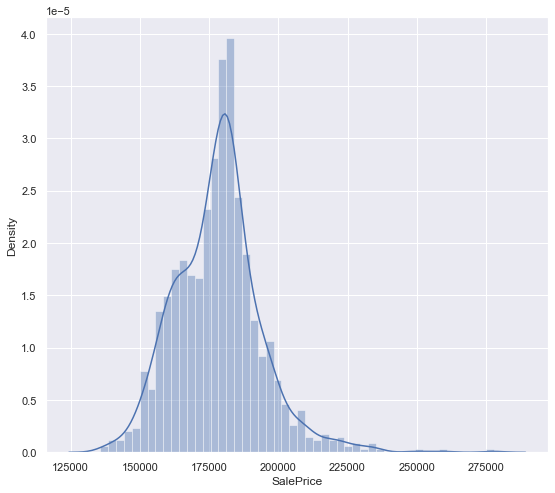

In [12]:
plt.figure(figsize=(9,8))     #this sets the size of figure
sns.distplot(df['SalePrice'],bins=50)  #with this we plot histogram of SalePrice and give it's kernel density estimate.
print("Skewness: %f" % df['SalePrice'].skew())
print("Kurtosis: %f" % df['SalePrice'].kurt())

In [13]:
cor_mat= df[:].corr()
cor_with_tar=cor_mat.sort_values(['SalePrice'],ascending=False)

In [14]:
print("The most relevant features (numeric) for the target are :")
cor_with_tar.SalePrice

The most relevant features (numeric) for the target are :


SalePrice       1.000000
BedroomAbvGr    0.813514
LotArea         0.686926
LotFrontage     0.499447
2ndFlrSF        0.344355
1stFlrSF        0.319452
FullBath        0.314649
GarageArea      0.245892
HalfBath        0.206062
KitchenAbvGr    0.169055
Id              0.138676
OverallQual     0.107261
YearBuilt       0.015349
BsmtHalfBath   -0.030641
BsmtFullBath   -0.052726
OverallCond    -0.075004
MSSubClass     -0.199732
Name: SalePrice, dtype: float64

#### INFERENCES:
Note that some of the features have quite high corelation with the target. These features are really significant.<br>

Of these the features with corelation value >0.5 are really important. Some features like BedroomAbvGr etc.. are even more important.<br>

We will consider these features (i.e. BedroomAbvGr,LotArea) etc.. in more detail in subsequent sections during univariate and bivariate analysis.<br>

<AxesSubplot:>

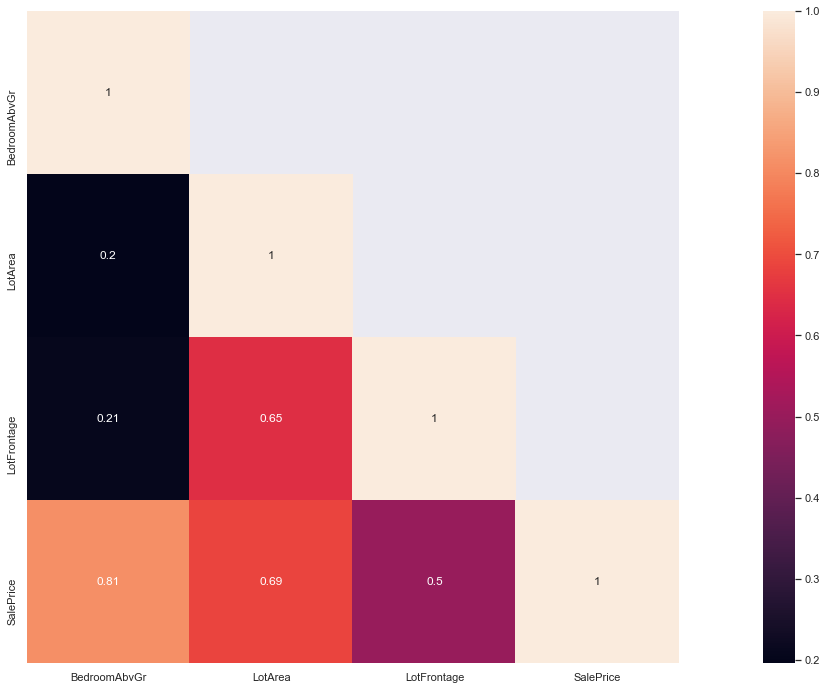

In [15]:
# using a corelation map to visualize features with high corelation.
cor_mat= df[['BedroomAbvGr','LotArea','LotFrontage','SalePrice']].corr()
mask = np.array(cor_mat)
mask[np.tril_indices_from(mask)] = False
fig=plt.gcf()
fig.set_size_inches(30,12)
sns.heatmap(data=cor_mat,mask=mask,square=True,annot=True,cbar=True)

#### Univariate Analysis:<br>
In this section the univariate analysis is performed; More importantly the features that are more importanht with the 'Target' that have high corelation with the Target.<br>

For Numeric features distplot' is used and 'boxplot' is used to analyze their distribution.<br>

In [16]:
def plot_cat(feature):
  sns.countplot(data=df,x=feature)
  ax=sns.countplot(data=df,x=feature)

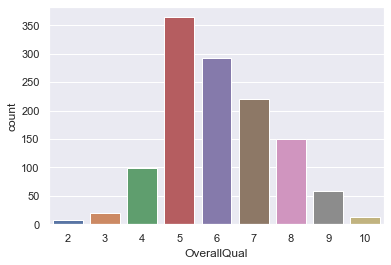

In [17]:
plot_cat('OverallQual')

#### Bivariate Analyasis:

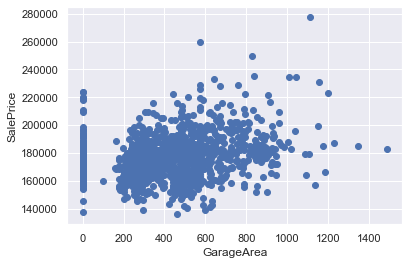

In [18]:
# garage area
fig, ax = plt.subplots()
ax.scatter(x =(df['GarageArea']), y = df['SalePrice'])
plt.ylabel('SalePrice')
plt.xlabel('GarageArea')
plt.show()
# can try to fremove the points with gargae rea > than 1200

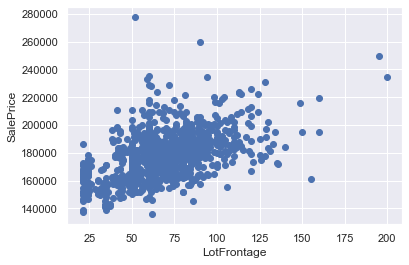

In [19]:
# garage area
fig, ax = plt.subplots()
ax.scatter(x =(df['LotFrontage']), y = df['SalePrice'])
plt.ylabel('SalePrice')
plt.xlabel('LotFrontage')
plt.show()
# can try to fremove the points with gargae rea > than 1200.

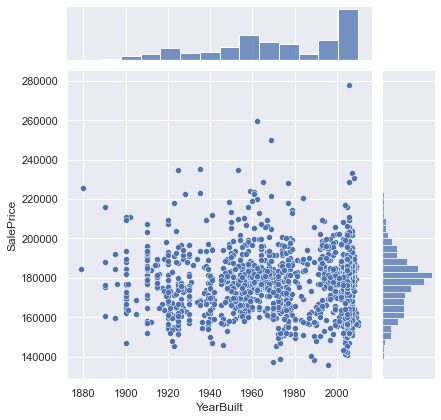

In [20]:
sns.jointplot(x="YearBuilt",y="SalePrice",data=df)

As it can be observed above maximum number of houses were sold in year 2000 and highest SalePrice was around 2800000 houses in the range from 1400000 to 200000 are having highest sale

<AxesSubplot:xlabel='OverallQual', ylabel='SalePrice'>

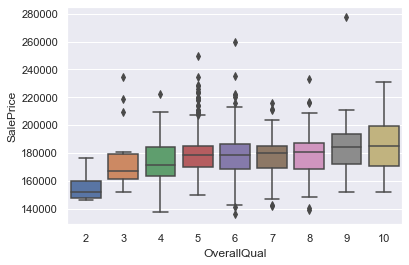

In [21]:
fig1 = fig.add_subplot(221); sns.boxplot(x='OverallQual', y='SalePrice',
data=df[['SalePrice', 'OverallQual']])

The SalePrice increases with the overall quality as expected.

<AxesSubplot:xlabel='GarageArea', ylabel='SalePrice'>

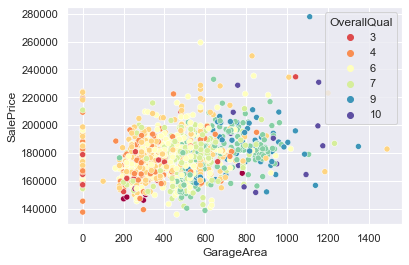

In [22]:
fig4 = fig.add_subplot(224);
sns.scatterplot(x = df.GarageArea, y = df.SalePrice, hue=df.OverallQual, palette= 'Spectral')

#### Bathrooms Features:
There are 4 bathroom variables in our data set. FullBath has the largest correlation with SalePrice between the others individually.

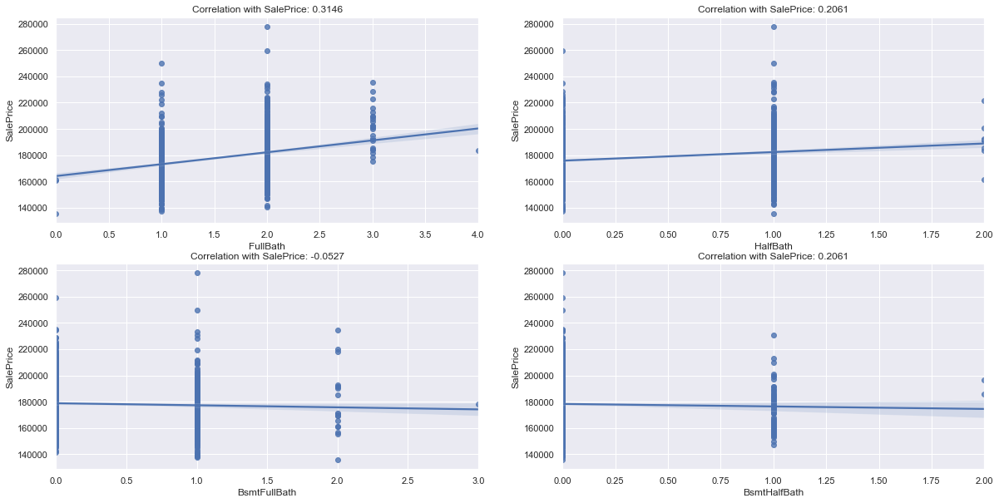

In [23]:
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(221); sns.regplot(x='FullBath', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.FullBath.corr(df['SalePrice'])))
fig2 = fig.add_subplot(222); sns.regplot(x='HalfBath', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.HalfBath.corr(df['SalePrice'])))
fig3 = fig.add_subplot(223); sns.regplot(x='BsmtFullBath', y='SalePrice',
data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtFullBath.corr(df['SalePrice'])))
fig4 = fig.add_subplot(224); sns.regplot(x='BsmtHalfBath', y='SalePrice',
data=df);plt.title('Correlation with SalePrice: {:6.4f}'.format(df.HalfBath.corr(df['SalePrice'])))
plt.show()

In [24]:
for col in df.columns: 
    print(col)

Id
MSSubClass
MSZoning
LotFrontage
LotArea
Street
LotShape
Utilities
OverallQual
OverallCond
YearBuilt
Heating
1stFlrSF
2ndFlrSF
BsmtFullBath
BsmtHalfBath
FullBath
HalfBath
BedroomAbvGr
KitchenAbvGr
GarageArea
SalePrice


In [25]:
results = df.dtypes        # check the data type of result table
print(results)

Id                int64
MSSubClass        int64
MSZoning         object
LotFrontage     float64
LotArea           int64
Street           object
LotShape         object
Utilities        object
OverallQual       int64
OverallCond       int64
YearBuilt         int64
Heating          object
1stFlrSF          int64
2ndFlrSF          int64
BsmtFullBath    float64
BsmtHalfBath    float64
FullBath          int64
HalfBath          int64
BedroomAbvGr      int64
KitchenAbvGr      int64
GarageArea      float64
SalePrice       float64
dtype: object


In [26]:
#Converting columns to categorical columns in order to do regression:
continuous_columns = ['Id','MSSubClass','LotFrontage','LotArea','OverallQual','OverallCond','YearBuilt','1stFlrSF','2ndFlrSF','BsmtFullBath','BsmtHalfBath',
                    'FullBath','HalfBath','BedroomAbvGr','GarageArea','SalePrice','KitchenAbvGr']

In [27]:
categorical_columns = [col for col in df.columns if col not in continuous_columns]
print(categorical_columns)

['MSZoning', 'Street', 'LotShape', 'Utilities', 'Heating']


In [28]:
# Columns converted to catogorical columns using as_ordered. 
for col_name, col in df[categorical_columns].items():
    df[col_name] = col.astype('category').cat.as_ordered()
print(df.dtypes)

Id                 int64
MSSubClass         int64
MSZoning        category
LotFrontage      float64
LotArea            int64
Street          category
LotShape        category
Utilities       category
OverallQual        int64
OverallCond        int64
YearBuilt          int64
Heating         category
1stFlrSF           int64
2ndFlrSF           int64
BsmtFullBath     float64
BsmtHalfBath     float64
FullBath           int64
HalfBath           int64
BedroomAbvGr       int64
KitchenAbvGr       int64
GarageArea       float64
SalePrice        float64
dtype: object


<ipython-input-28-eaacaceb6b82>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col_name] = col.astype('category').cat.as_ordered()


In [29]:
housing_data = df.copy()
housing_train_data = pd.get_dummies(housing_data, columns=['MSZoning','LotShape','Utilities','Heating','Street'], prefix = ['MSZoning','LotShape','Utilities','Heating','Street'])

print(housing_train_data.dtypes)

Id                    int64
MSSubClass            int64
LotFrontage         float64
LotArea               int64
OverallQual           int64
OverallCond           int64
YearBuilt             int64
1stFlrSF              int64
2ndFlrSF              int64
BsmtFullBath        float64
BsmtHalfBath        float64
FullBath              int64
HalfBath              int64
BedroomAbvGr          int64
KitchenAbvGr          int64
GarageArea          float64
SalePrice           float64
MSZoning_C (all)      uint8
MSZoning_FV           uint8
MSZoning_RH           uint8
MSZoning_RL           uint8
MSZoning_RM           uint8
LotShape_IR1          uint8
LotShape_IR2          uint8
LotShape_IR3          uint8
LotShape_Reg          uint8
Utilities_AllPub      uint8
Heating_GasA          uint8
Heating_GasW          uint8
Heating_Grav          uint8
Heating_Wall          uint8
Street_Grvl           uint8
Street_Pave           uint8
dtype: object


In [30]:
print(housing_train_data)

        Id  MSSubClass  LotFrontage  LotArea  OverallQual  OverallCond  \
0     1461          20         80.0    11622            5            6   
1     1462          20         81.0    14267            6            6   
2     1463          60         74.0    13830            5            5   
3     1464          60         78.0     9978            6            6   
4     1465         120         43.0     5005            8            5   
...    ...         ...          ...      ...          ...          ...   
1454  2915         160         21.0     1936            4            7   
1455  2916         160         21.0     1894            4            5   
1456  2917          20        160.0    20000            5            7   
1457  2918          85         62.0    10441            5            5   
1458  2919          60         74.0     9627            7            5   

      YearBuilt  1stFlrSF  2ndFlrSF  BsmtFullBath  ...  LotShape_IR2  \
0          1961       896         0    

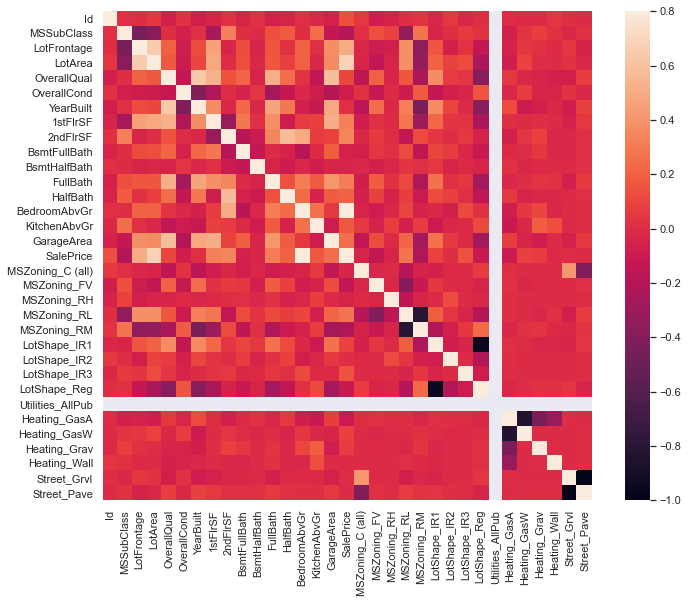

In [31]:
# Plotting the correlation matrix and observe the heatmap
corrmatrix = housing_train_data.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmatrix, vmax=.8, square=True);

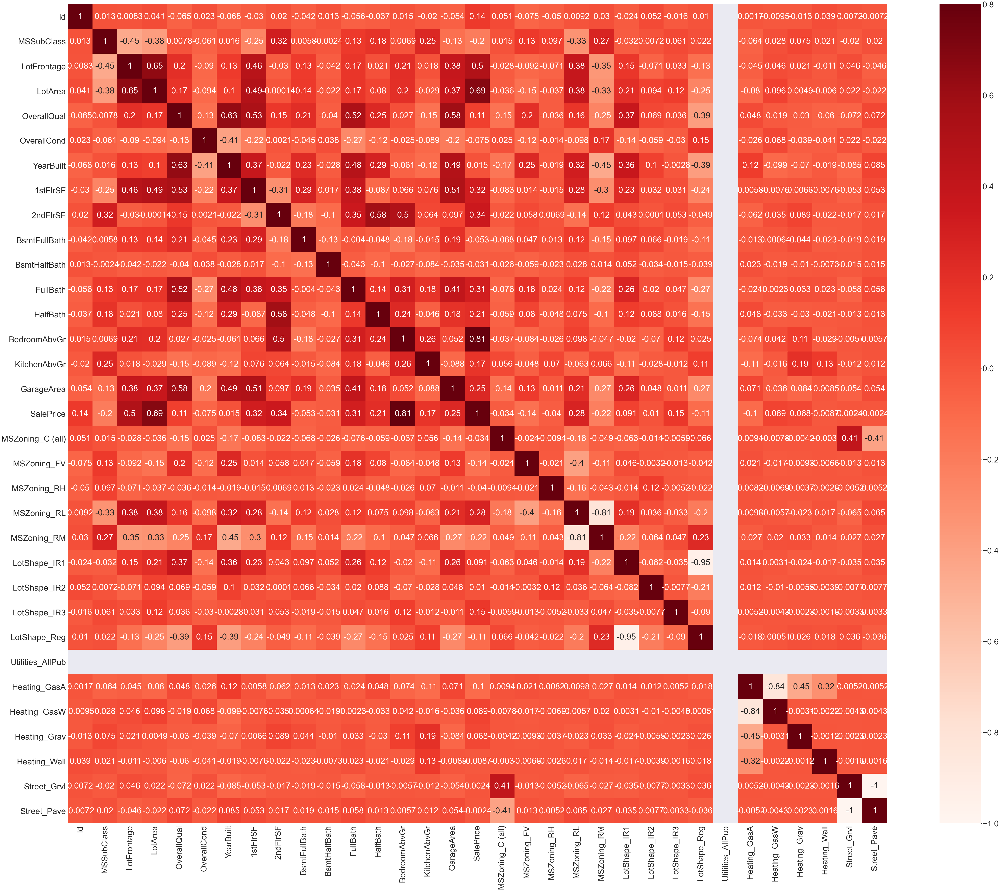

In [32]:
# correlation matrix with the correlation values in heatmap
plt.figure(figsize=(100,80))
cor = housing_train_data.corr()
sns.set(font_scale=4)
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds,annot_kws={"size": 45},vmax=.8, square=True)
plt.show()

In [33]:
#take the threshold value as 0.2 and all the columns having value greater than threshold are selected for regression
threshold = 0.2
filtered_data = abs(cor['SalePrice'])
result = filtered_data[filtered_data>0.2]
print(result)

LotFrontage     0.499447
LotArea         0.686926
1stFlrSF        0.319452
2ndFlrSF        0.344355
FullBath        0.314649
HalfBath        0.206062
BedroomAbvGr    0.813514
GarageArea      0.245892
SalePrice       1.000000
MSZoning_RL     0.278746
MSZoning_RM     0.217509
Name: SalePrice, dtype: float64


In [34]:
#form a final train data on which regression is to be done
final_train_data = housing_train_data[['MSSubClass','LotFrontage','LotArea','1stFlrSF','2ndFlrSF','FullBath','HalfBath',
                    'BedroomAbvGr','GarageArea','SalePrice','MSZoning_RL','MSZoning_RM']]
print(final_train_data)

      MSSubClass  LotFrontage  LotArea  1stFlrSF  2ndFlrSF  FullBath  \
0             20         80.0    11622       896         0         1   
1             20         81.0    14267      1329         0         1   
2             60         74.0    13830       928       701         2   
3             60         78.0     9978       926       678         2   
4            120         43.0     5005      1280         0         2   
...          ...          ...      ...       ...       ...       ...   
1454         160         21.0     1936       546       546         1   
1455         160         21.0     1894       546       546         1   
1456          20        160.0    20000      1224         0         1   
1457          85         62.0    10441       970         0         1   
1458          60         74.0     9627       996      1004         2   

      HalfBath  BedroomAbvGr  GarageArea    SalePrice  MSZoning_RL  \
0            0             2       730.0  169277.0525            

In [35]:
# X and Y coefficients required for regression:
X = final_train_data[['MSSubClass','LotFrontage','LotArea','1stFlrSF','2ndFlrSF','FullBath','HalfBath',
                    'BedroomAbvGr','GarageArea','MSZoning_RL','MSZoning_RM']]
Y = final_train_data[['SalePrice']]

In [36]:
#Splitting the data into Train and Test
from sklearn.model_selection import train_test_split, KFold, cross_val_score
xtrain, xtest, ytrain, ytest = train_test_split(X,Y,test_size=1/3, random_state=0)
# 1/3rd of the train data will be selected as test data
print("xtrain : " + str(xtrain.shape))
print("xtest : " + str(xtest.shape))
print("ytrain : " + str(ytrain.shape))
print("ytest : " + str(ytest.shape))
print(xtrain)
print(ytrain)

xtrain : (817, 11)
xtest : (409, 11)
ytrain : (817, 1)
ytest : (409, 1)
      MSSubClass  LotFrontage  LotArea  1stFlrSF  2ndFlrSF  FullBath  \
858           60         64.0     7713       728       728         2   
61            20         80.0    10032      1580         0         1   
796           60         60.0     7500       957      1342         3   
1339          30         50.0     9000       819         0         1   
1320          30         50.0     5633       844         0         1   
...          ...          ...      ...       ...       ...       ...   
909          160         24.0     2280       757       744         2   
992           20         52.0     8626       968         0         1   
1449         180         21.0     1470       630         0         1   
659           50         60.0     5520       565       651         1   
824          120         24.0     2304      1055         0         2   

      HalfBath  BedroomAbvGr  GarageArea  MSZoning_RL  MSZoning

In [37]:
xtrain = xtrain.fillna(0)  # fill the null values with 0/
print(xtrain)

      MSSubClass  LotFrontage  LotArea  1stFlrSF  2ndFlrSF  FullBath  \
858           60         64.0     7713       728       728         2   
61            20         80.0    10032      1580         0         1   
796           60         60.0     7500       957      1342         3   
1339          30         50.0     9000       819         0         1   
1320          30         50.0     5633       844         0         1   
...          ...          ...      ...       ...       ...       ...   
909          160         24.0     2280       757       744         2   
992           20         52.0     8626       968         0         1   
1449         180         21.0     1470       630         0         1   
659           50         60.0     5520       565       651         1   
824          120         24.0     2304      1055         0         2   

      HalfBath  BedroomAbvGr  GarageArea  MSZoning_RL  MSZoning_RM  
858          1             3       400.0            1            0

In [38]:
(np.isnan(xtrain))

,MSSubClass,LotFrontage,LotArea,1stFlrSF,2ndFlrSF,FullBath,HalfBath,BedroomAbvGr,GarageArea,MSZoning_RL,MSZoning_RM
858,False,False,False,False,False,False,False,False,False,False,False
61,False,False,False,False,False,False,False,False,False,False,False
796,False,False,False,False,False,False,False,False,False,False,False
1339,False,False,False,False,False,False,False,False,False,False,False
1320,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
909,False,False,False,False,False,False,False,False,False,False,False
992,False,False,False,False,False,False,False,False,False,False,False
1449,False,False,False,False,False,False,False,False,False,False,False
659,False,False,False,False,False,False,False,False,False,False,False


In [39]:
xtest = xtest.fillna(0)
ytest = ytest.fillna(0)
print(xtest)

      MSSubClass  LotFrontage  LotArea  1stFlrSF  2ndFlrSF  FullBath  \
1285          20         66.0    12778      1008         0         1   
5             60         75.0    10000       763       892         2   
1089          20        128.0    39290      5095         0         2   
141           50         50.0     9140       727       380         1   
1394          20         70.0     8810      1390         0         2   
...          ...          ...      ...       ...       ...       ...   
966           70         60.0    10800       751       783         1   
369           70         57.0     8094      1048       720         2   
631           50         63.0     7628      1095       561         2   
690           50         50.0     5190       617       462         1   
1310          20         70.0     7000       864         0         1   

      HalfBath  BedroomAbvGr  GarageArea  MSZoning_RL  MSZoning_RM  
1285         0             2       280.0            1            0

In [40]:
print(ytest)

        SalePrice
1285  169618.3499
5     177150.9892
1089  230841.3386
141   162182.5962
1394  177294.8389
...           ...
966   184733.1285
369   176507.3702
631   162107.1687
690   152889.5210
1310  172627.7969

[409 rows x 1 columns]


In [41]:
import sklearn
from sklearn import linear_model
model_reg = linear_model.LinearRegression()    # form a linear regression model

In [42]:
ytrain = ytrain.fillna(0)
print(ytrain)

        SalePrice
858   178657.7941
61    179423.7516
796   205895.2546
1339  171022.2414
1320  162186.0712
...           ...
909   170175.2268
992   164968.9479
1449  137402.5699
659   170129.5314
824   151422.1169

[817 rows x 1 columns]


In [44]:
model_reg.fit(xtrain,ytrain)  # check for fit of regression model

LinearRegression()

In [45]:
model_reg.score(xtrain,ytrain)  # check the score of regression model

0.9512519845964049

In [46]:
model_reg.coef_

array([[ 2.62367221e+00, -4.61232867e+00,  2.00775613e+00,
        -2.31956830e-01, -1.79324640e-01, -1.13598669e+02,
        -1.94142292e+02,  1.34823355e+04,  4.34307634e-01,
         1.29141441e+02, -2.39764954e+02]])

In [47]:
model_reg.intercept_

array([121507.58127551])

In [48]:
predictions = model_reg.predict(xtest)   # we can observe the predictions in an excel file on the computer by following below path

In [49]:
predictionsdf = pd.DataFrame(predictions)
predictionsdf.to_excel("D:/Sem1/IDS/Project/output1.xlsx")

In [50]:
from sklearn import metrics
print("Evaluation of the prediction model : Mean Absolute error")
print(metrics.mean_absolute_error(ytest,predictionsdf))
print("Mean Squared error")
print(metrics.mean_squared_error(ytest,predictionsdf))

Evaluation of the prediction model : Mean Absolute error
2915.135547907341
Mean Squared error
12587212.795744255


### CONCLUSION
We can hereby conclude that having a bedroom above ground level is highly correlated with our main attribute SalePrice and also affects the house value, the most. Also, multiple linear regression best fits our dataset as the R square value is 0.95 which is a good number.<br>

References:<br>
https://realpython.com/python-data-cleaning-numpy-pandas/<br>

https://towardsdatascience.com/data-cleaning-with-python-and-pandas-detecting-missing-values-3e9c6ebcf78b<br>